## model_DriftingGratings

1) Runs steerable pyramid on 2 drifting grating stimulus sets (Cartesian, Polar)
2) Runs various types of normalization, and plots the output magnitude per polar angle

## DONE:

- Added SF channels to analysis, global intercept is higher for polar stimuli
- Applied the imbalance to all SF channels (before was only the "match")
- Applied 4D convolution (across n_SF, n_ORIs, X, Y) - this pads all dimensions (ori, sf, x, y treated as the same)
    -   Model 1) Divisive norm
    -   Model 2) Divisive norm with exponential suppression
    -   Model 3) Ori-tuned divisive norm
    -   Model 6) Normalization by StimHomogeneity (consistency of channel distribution)
          - I think this conceptually combines Anisotropy model and suppressive exponent model (& consistent w/ Cavanagh et al.?)
    -   TO VISUALIZE OUTPUT: taking an average across SF channels to compress output to ORI channels
- For the anisotropy models, there is no convolution, so I just average across SF channels before computing std
    -   Model 4) Orientation-anisoptropy model (input: average SF, collapse space, then compute global ori std)
    -   Model 5) Orientation-anisoptropy model 2 (same as above but do not collapse space)
    -   TO VISUALIZE OUTPUT: averaging across SF channels is not needed, done before the normalization
- Created a new model (Model 6) to address:
      (1) something that suppresses homogeneity (like the orientation anisotropy model)
      (2) uses suppressive exponent
      (2) might(?) explain results from Cavanagh, Bair & Movshon: suppression determined by stimulus homogeneity
- Added the radial & cardinal weights based on human behavior
    - Cardinal is just a weight on the cardinal channels
    - Radial is a weight applied to each channel with the corresponding polar angles with the full weight, and orthogonal directions as no weight (e.g., vertical channel would have a gradient that peaks at 90 and 270)
- Added radial analysis
- Converted to energy rather than magnitude

## Qs:

- For 4D gaussian convolution, I am using the a symmetric std in all 4Ds. This doesn't seem right. How to decide on sigma for other Ds?
- For some reason, the balanced population shows greater magnitude for local tangential energy than radial energy (but equal distr. in the local cartesian orientations).
- Regardless of this issue, the radial overrepresentation results in suppression for radial
      - Maybe an alternative is to think of cardinal overepresentation as suppression, and polar as facilitation.
      - Supported by neural data. Could highlight different mechanisms: cardinal=greater neurons; polar=feedback or lateral conn?
- For anistropy model,
      - I can implement graded gauss for ori -- but for now, I am doing large vs small gauss like Fang .. Winawer 2023 paper.
      - How to treat SF? Same with StimHomogeneity model?

## TO DO:
- Plot SFs of the stimuli
- Add polar cardinal asymmetry?
- Orientation anisotropy model- probably need to add a spatial window-right now both models compute global std.
- Literature review of suppressive drive as exponent (untuned?)
- Relabel all axes with "magnitude" to "energy"
- Add more orientation channels?


In [1]:
import contextlib
import itertools
import os
import ipdb
import sys
import json
from PIL import Image
import pandas as pd
import seaborn as sns
import cv2
from itertools import product
from matplotlib import colors
import copy

from helper_functions import pyrmodel
from helper_functions import utils_image
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from torch import nn
from tqdm.auto import tqdm

import plenoptic as po
from plenoptic.simulate import SteerablePyramidFreq
from plenoptic.tools.data import to_numpy

In [2]:
# this notebook uses torchvision, which is an optional dependency.
# if this fails, install torchvision in your plenoptic environment
# and restart the notebook kernel.
try:
    import torchvision
except ModuleNotFoundError:
    raise ModuleNotFoundError(
        "optional dependency torchvision not found!"
        " please install it in your plenoptic environment "
        "and restart the notebook kernel"
    )
import torchvision.transforms as transforms

dtype = torch.float32

# handle for tensors (use GPU if possible)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# magic commands to auto-reload imported modules anytime they are changed on disk
%load_ext autoreload
%autoreload 2

# so that relative sizes of axes created by po.imshow and others look right
plt.rcParams["figure.dpi"] = 72

%matplotlib inline

plt.rcParams["animation.html"] = "html5"
# use single-threaded ffmpeg for animation writer
plt.rcParams["animation.writer"] = "ffmpeg"
plt.rcParams["animation.ffmpeg_args"] = ["-threads", "1"]

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
# make the stimulus diameter 870 pixels, and image 896 pixels, padding of 13 pixels per edge
# stimulus diameter is 24.4 deg, 870 pixels. So adjust degrees based on this ratio.

img_size = 896                                     # limited by sqrt n_sf x ;
exp_stim_diamDeg = 24.4                            # needed to make stimulus approx the same as in experiment

x = int(np.round(img_size*0.85))                   # compute 97% of the img_size
x = x if x % 2 == 0 else x+1                       # if its odd, subtract 1 to make it even

img_size_nonPadded = x
pixpdeg = x/exp_stim_diamDeg
padded_img_degrees = img_size/pixpdeg              # derive degrees of padded image

############################################################################

n_ori = 4
n_sf = 6


my_model = pyrmodel.SteerablePyramidSF(n_ori=n_ori,
                                       n_sf=n_sf,
                                       img_size=img_size,
                                       img_degrees=padded_img_degrees,
                                       is_complex=True,
                                       downsample=False,
                                       tight_frame=True,
                                       device='cpu')


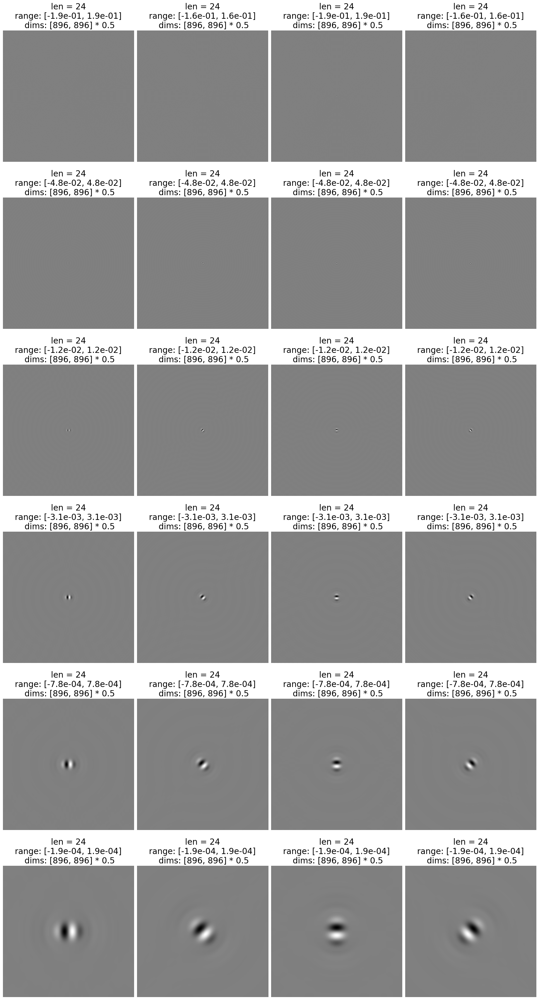

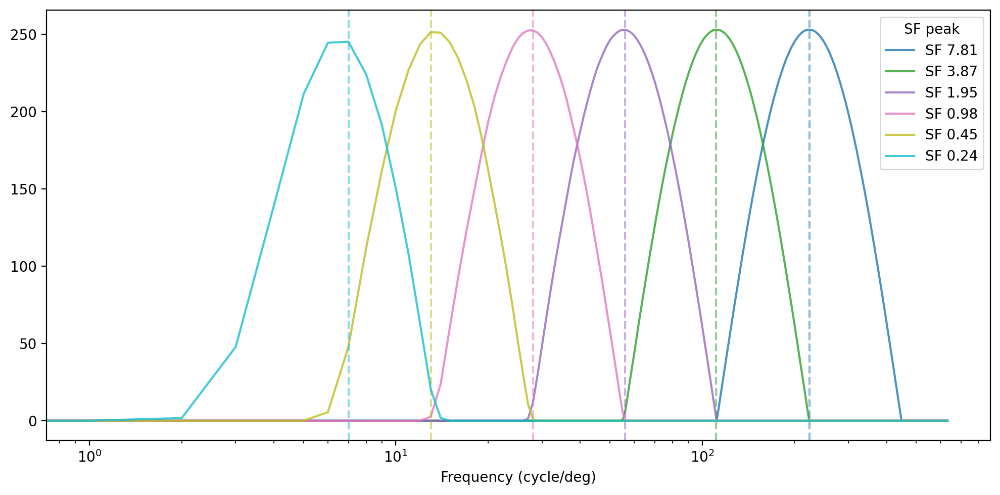

In [4]:
# this depends on img_size (.25, .125, 0.06, 0.03, 0.015, 0.006)
# also changes with n_sf (more low SF ch, and minimally with n_ori)

filter_sf_tunings = my_model.get_filter_sf_tunings()
colors = plt.cm.tab10(np.linspace(0, 1, n_sf))
fig, axes = plt.subplots(1, 1, figsize=(10, 5), dpi=200)
chSFs = {}
for i, sf in enumerate(range(n_sf)):
    k = np.where(filter_sf_tunings[sf] == filter_sf_tunings[sf].max())[0][0]
    chSFs[i] = np.round(k/my_model.img_degrees,2)
    axes.plot(range(filter_sf_tunings.shape[-1]), 
              filter_sf_tunings[sf], 
              alpha=0.8, 
              label=f'SF {np.round(k/my_model.img_degrees,2)}', 
              color=colors[sf])
    axes.axvline(k, color=colors[sf], linestyle='--', alpha=0.5)

axes.set_xlabel('Frequency (cycle/deg)')
current = axes.get_xticks()
axes.set_xticks(current)
new = current/my_model.img_degrees
axes.set_xticklabels(np.round(new,2))
axes.legend(title='SF peak', loc='best')
axes.set_xscale("log")   # for log axis
plt.tight_layout();


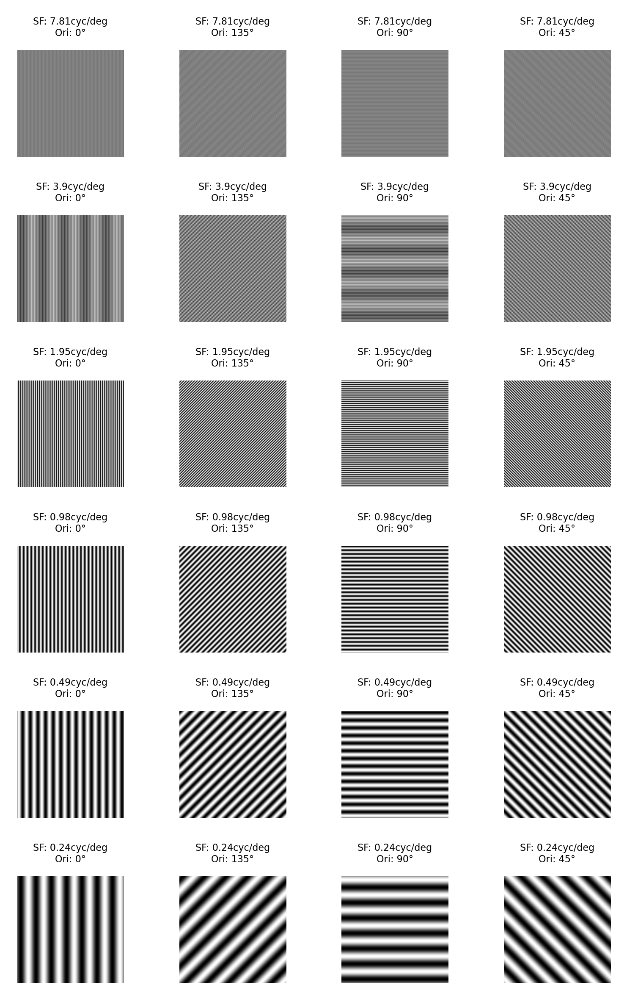

In [5]:
representative_chIdx = min(chSFs, key=lambda k: abs(chSFs[k] - 1)) # for later, this is idx closest to 1cyc/deg
optimal_stims = my_model.reconstruct_optimal_stimuli(visualize=True)

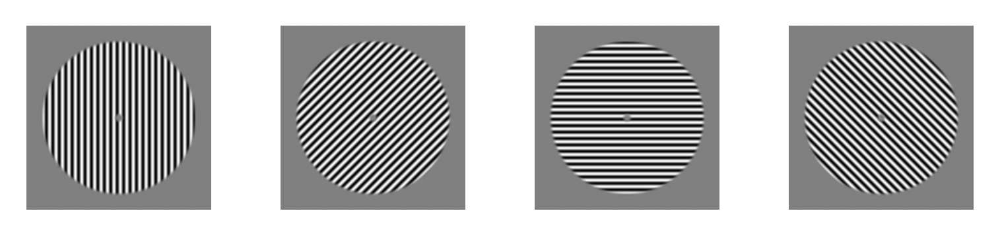

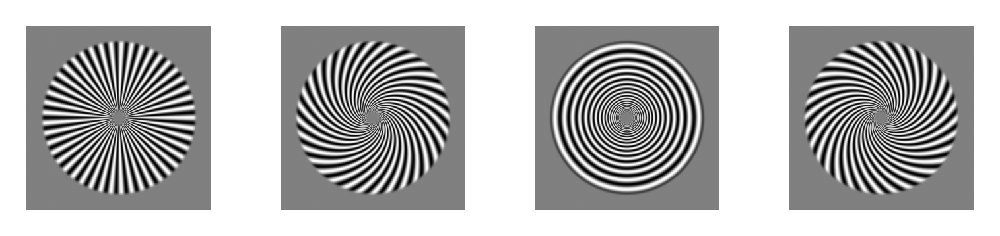

In [6]:
# Create input stimulus for the pyramid

sfs = np.array([1])               # cycles/deg
oris=np.array([0,135,90,45])      # degrees
stim = {}

for ri, ref in enumerate(["cartesian", "polar"]):
    stim[ri] = pyrmodel.InputStimuli(
        sfs=sfs,            
        oris=oris,
        img_size=img_size,
        img_degrees=padded_img_degrees,
        referenceframe=ref,
        mask=True,
        paddedBondaryPerc = exp_stim_diamDeg/padded_img_degrees
    )
    
    num_sf  = len(sfs)
    num_ori = len(oris)
    
    fig, axes = plt.subplots(num_sf, num_ori, figsize=(num_ori, num_sf), dpi=400)
    
    # force axes to always be 2D
    axes = np.atleast_2d(axes)
    
    for i, sf in enumerate(sfs):
        for j, ori in enumerate(oris):
            axes[i, j].imshow(stim[ri].input[i, j], cmap='gray', vmin=-1, vmax=1)
            axes[i, j].axis('off')
    plt.tight_layout()


In [7]:
# prepare stack of images to convert to tensor (preparing for pyramid)

# build numpy stack (dim0=set type, dim1=ori, dim2=X, dim3=Y)
arr = np.stack([
    np.stack([stim[i].input[(0,j)] for j in range(4)])
    for i in range(2)
])

input_tensor = torch.from_numpy(arr).float()
np.shape(input_tensor)

#po.imshow(input_tensor, batch_idx=0);
#po.imshow(input_tensor, batch_idx=1);

torch.Size([2, 4, 896, 896])

In [8]:
#type(input_tensor)

In [9]:
dim_im = img_size

# build a steerable pyramid object
pyr = SteerablePyramidFreq(height=n_sf, 
                           image_shape=[dim_im, dim_im], 
                           order=3, is_complex=True,
                           tight_frame=True).to(
                           DEVICE
                           )

# pass the Tensor into the object
stim_coeffs = pyr(input_tensor)      # pass these stim inputs into pyramid

#stim_coeffs = my_model.forward(input_tensor)
print(stim_coeffs.keys())

# display output image per stimulus per channel
po.pyrshow(stim_coeffs, vrange='auto1', zoom=1, batch_idx=0) # first image of the batch (cartesian)
po.pyrshow(stim_coeffs, vrange='auto1', zoom=1, batch_idx=1); # second image of the batch (polar)

odict_keys(['residual_highpass', (0, 0), (0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3), (2, 0), (2, 1), (2, 2), (2, 3), (3, 0), (3, 1), (3, 2), (3, 3), (4, 0), (4, 1), (4, 2), (4, 3), (5, 0), (5, 1), (5, 2), (5, 3), 'residual_lowpass'])


In [10]:
all_data = []  # to store (sf, ori, batch, channel, energy_value)

for key, tensor in stim_coeffs.items():
    if isinstance(key, tuple):
        sf, ori = key
        for b in range(tensor.shape[0]):      # batch index
            for c in range(tensor.shape[1]):  # channel index
                img = tensor[b, c].abs() ** 2
                energy_value = img.mean().item()   # or .sum().item(), depending on what you want
                all_data.append([sf, ori, b, c, energy_value])
    else:
        continue  # skip residuals

# Convert list → NumPy array
all_data = np.array(all_data)  # shape [N, 5], columns = [sf, ori, batch, channel, energy]


In [11]:
#representative_chIdx

# ordered dictionary
#odict_keys(['residual_highpass', 
#(0, 0), (0, 1), (0, 2), (0, 3), 
#(1, 0), (1, 1), (1, 2), (1, 3), 
#(2, 0), (2, 1), (2, 2), (2, 3), 
#(3, 0), (3, 1), (3, 2), (3, 3), <----
#(4, 0), (4, 1), (4, 2), (4, 3), 
#(5, 0), (5, 1), (5, 2), (5, 3), 
#'residual_lowpass'])

# tmp = my_model.get_energy_of_filters(stim_coeffs, 
#                                          to_magnitude=True, 
#                                          to_numpy=True, 
#                                          reshape=True, 
#                                          normalize=False)

# for key, arr in stim_energy.items():
#     print(key, arr.shape)

Plot output of pyramid, with balanced ori channels
BALANCED PYRAMID OUTPUT
no scale given, so computing shared scale: global min/max


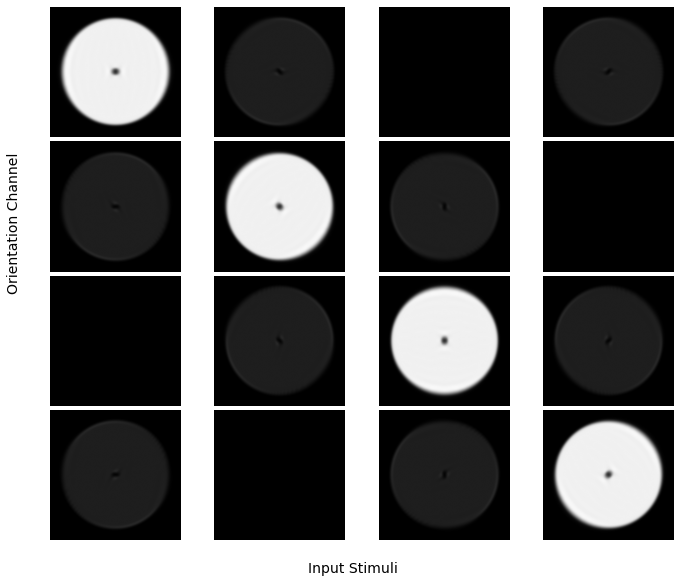

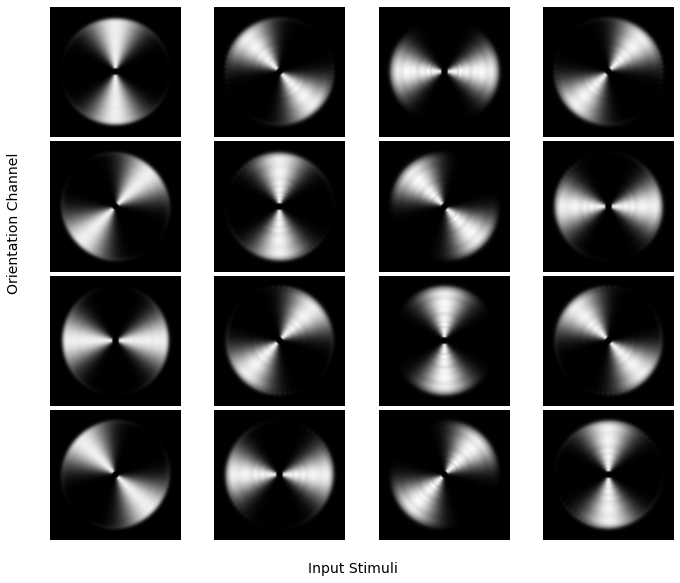

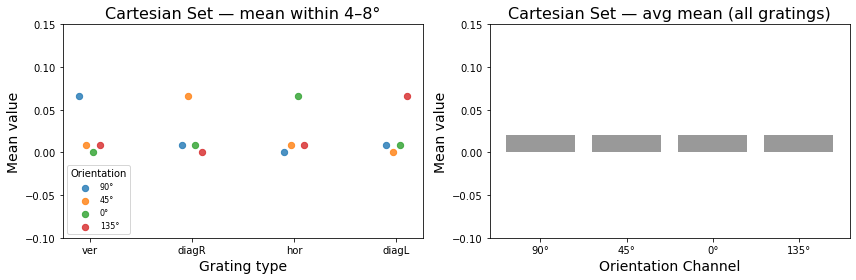

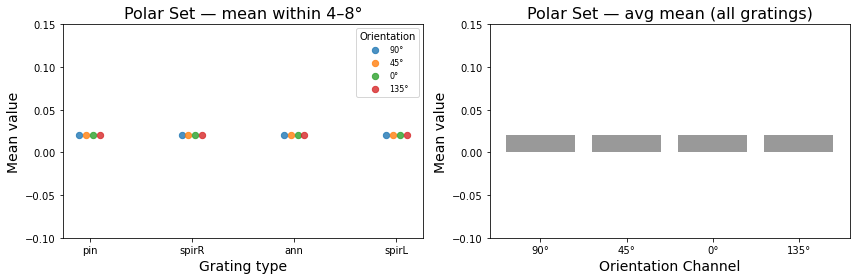

Cartesian Set


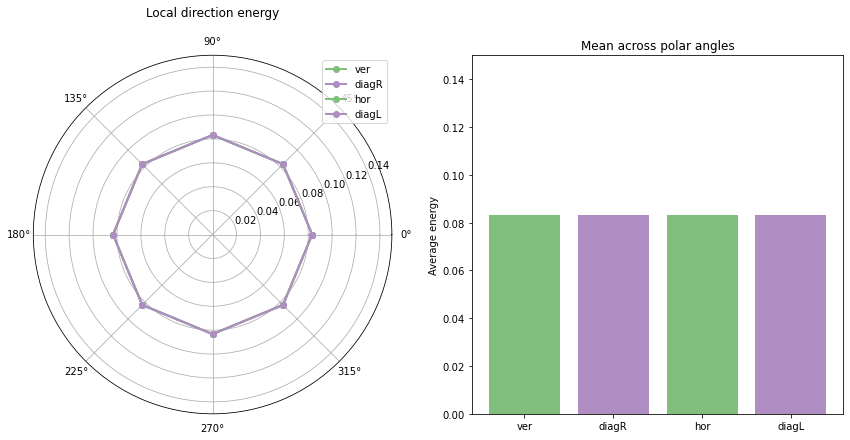

Polar Set


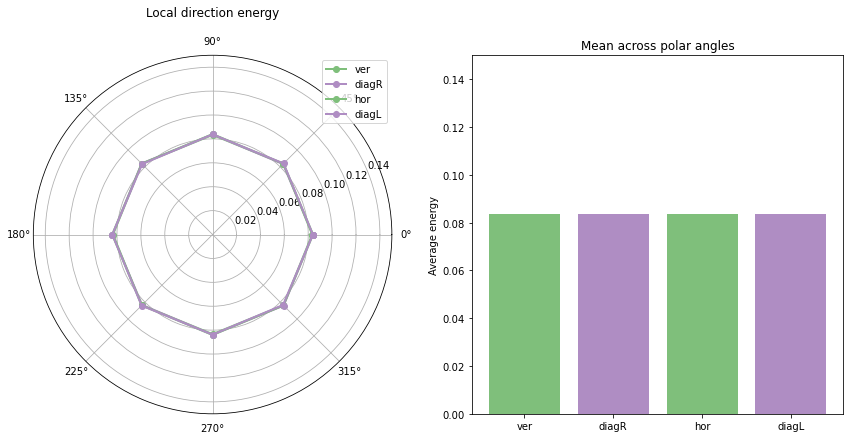

Cartesian Set


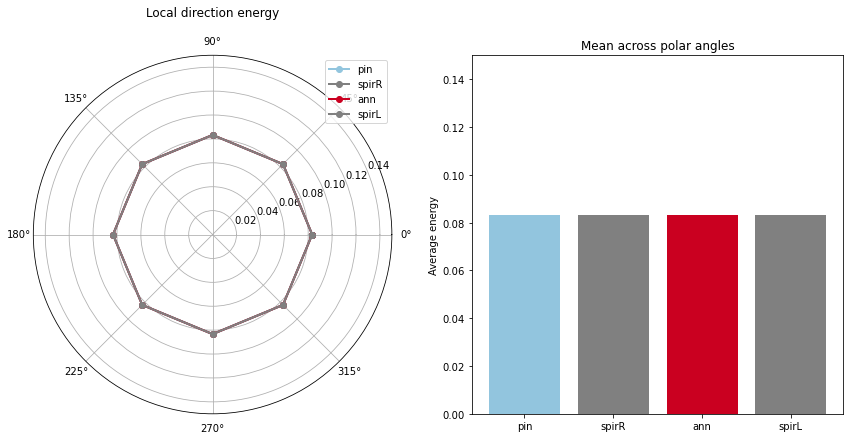

Polar Set


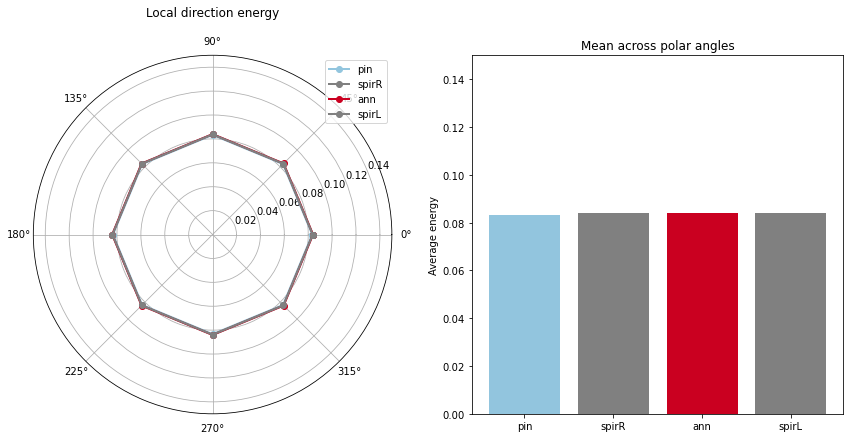

In [12]:
np.shape(input_tensor)

print('Plot output of pyramid, with balanced ori channels')

stim_energy = {}
n_set = 2
n_stimuli = 4

for i, j in product(range(n_set), range(n_stimuli)):
    stim_coeffs = my_model.forward(input_tensor[i, j, :, :])
    energy = my_model.get_energy_of_filters(stim_coeffs,
                                            to_magnitude=False,  # compute energy, rather than mag (just squaring)
                                            to_numpy=True,
                                            reshape=True,
                                            normalize=False)    # do not need to do this, due to tight pyramid?
    stim_energy[(i, j)] = energy

# my_model.visualize_filter_magnitudes(stim_energy, 
#                                      share_color_range=True, 
#                                      title='Optimal Stimuli E')


print("BALANCED PYRAMID OUTPUT")
stim_energy_aveSF = utils_image.condense_energy(stim_energy, dim=0, operation="mean")

utils_image.visualize_filter_magnitudes(stim_energy_aveSF, 0, scale=None, share_color_range=True, title=None,
                                        cbar=False, scale_factor=3, save_path=None)
#[scaleMin, scaleMax]

utils_image.plot_energy_per_channel(stim_energy_aveSF, 0, pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[-.1, 0.15])

utils_image.plot_energy_per_stim(stim_energy_aveSF, 0, "Cartesian analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[0, 0.15])

utils_image.plot_energy_per_stim(stim_energy_aveSF, 0, "Polar analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[0, 0.15])


IMBALANCED PYRAMID OUTPUT
no scale given, so computing shared scale: global min/max


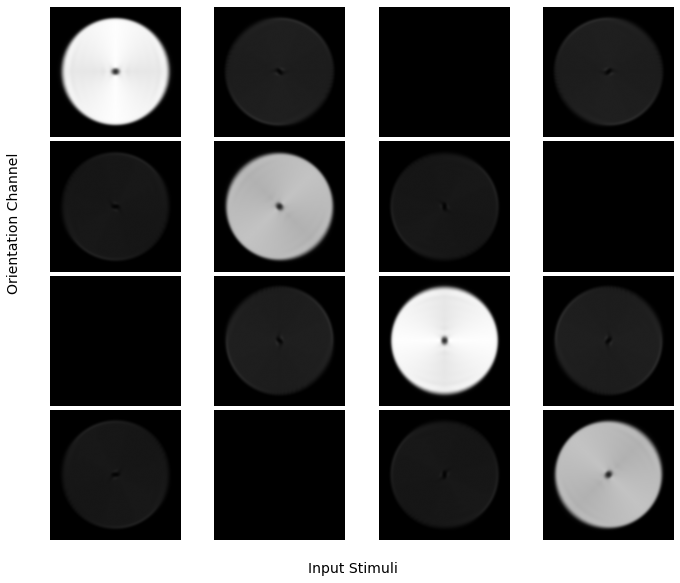

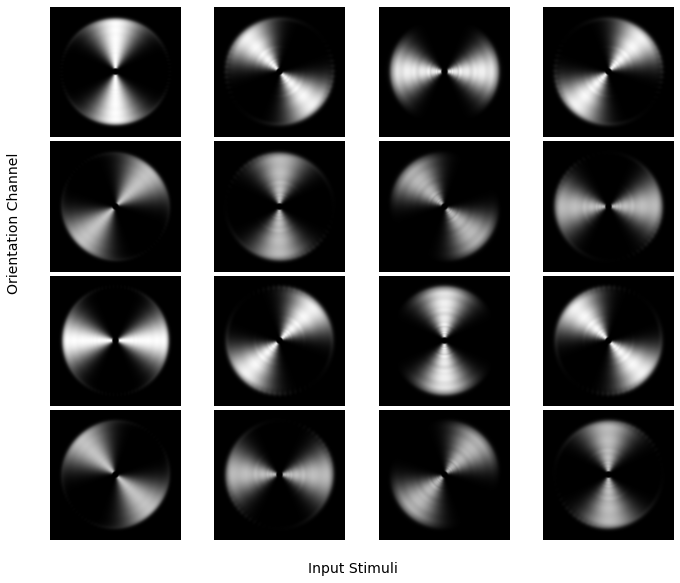

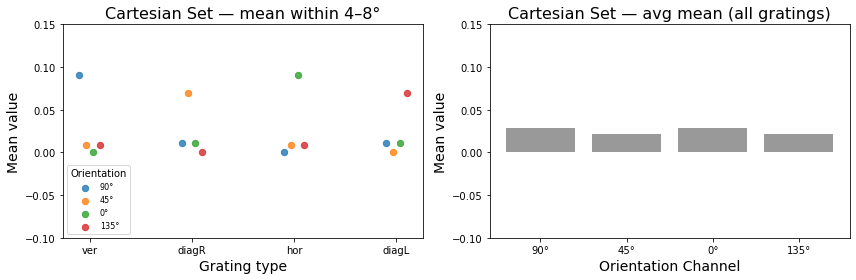

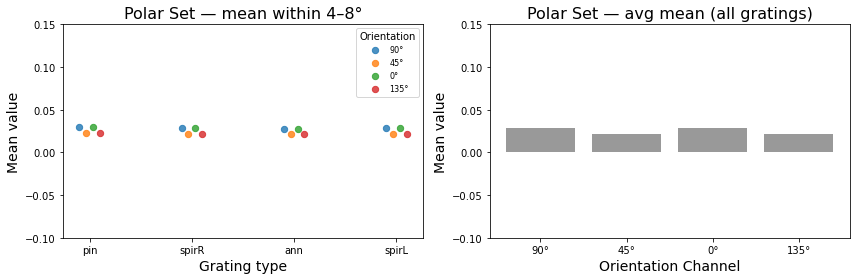

Cartesian Set


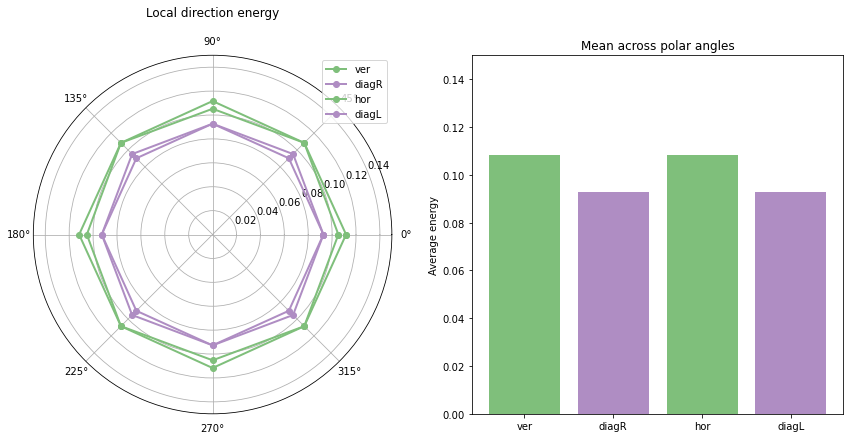

Polar Set


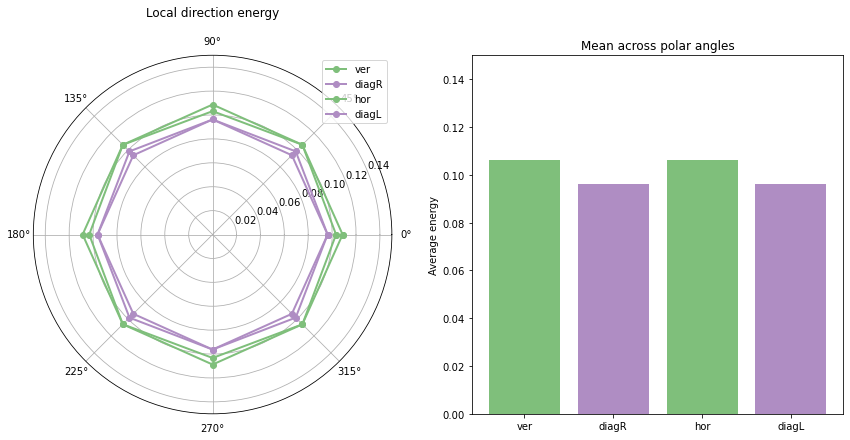

Cartesian Set


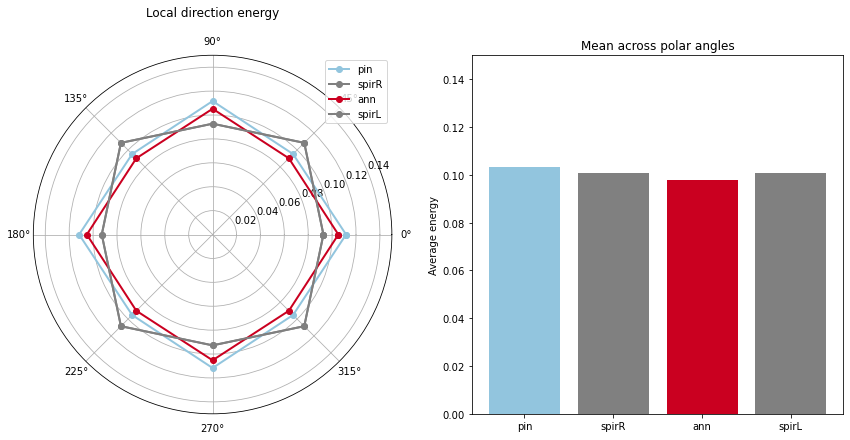

Polar Set


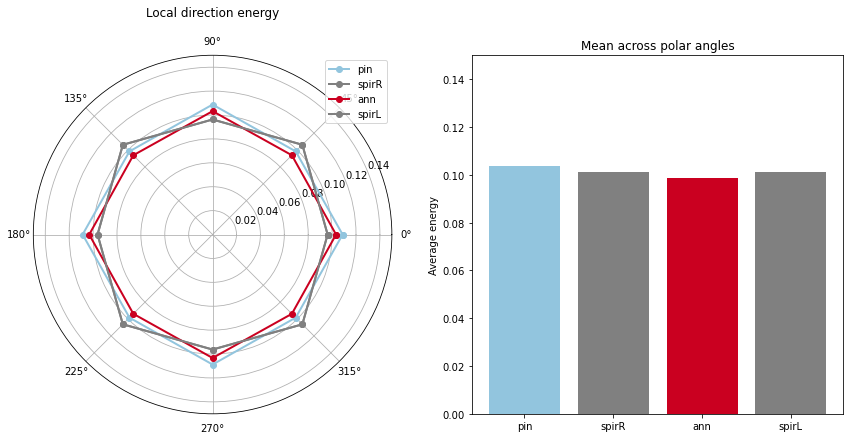

In [13]:
# create imbalanced population for a given channel

print("IMBALANCED PYRAMID OUTPUT")
# based on Fang et al 2022 -- The cardinal and radial components modulated 10.90% and 14.83%, respectively. (In macaque V1)
stim_energy_imb = utils_image.imposeImbalance(stim_energy, cardinal=1.3, radial=1.1)

stim_energy_imb_aveSF = utils_image.condense_energy(stim_energy_imb, dim=0, operation="mean")

utils_image.visualize_filter_magnitudes(stim_energy_imb_aveSF, 0, scale=None, share_color_range=True, title=None,
                                        cbar=False, scale_factor=3, save_path=None)

utils_image.plot_energy_per_channel(stim_energy_imb_aveSF, 0, pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[-0.1, 0.15])

utils_image.plot_energy_per_stim(stim_energy_imb_aveSF, 0, "Cartesian analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[0, 0.15])

utils_image.plot_energy_per_stim(stim_energy_imb_aveSF, 0, "Polar analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[0, 0.15])

In [14]:
# untuned divisive normalization

# # sum across the SF dimension:

# # stim_energy_imb_summedSF = {
# #     key: np.sum(val, axis=0, keepdims=True)
# #     for key, val in stim_energy_imb.items()
# # }

# # untuned_norm_energy = utils_image.canonical_normalization(stim_energy_imb_summedSF, pixpdeg, representative_chIdx=0, tuned=False)

# # or keep it isolated to SF of interest
# #stim_energy_imb_selectSF = stim_energy_imb

# stim_energy_imb_selectSF = {
#     key: arr[3:4, ...]     # slice keeps shape (1, 4, 896, 896)
#     for key, arr in stim_energy_imb.items()
# }

# # to run on select SF channel
# #untuned_norm_energy = utils_image.canonical_normalization(stim_energy_imb_selectSF, pixpdeg, representative_chIdx=0, tuned=False)

print("UNTUNED DIVISIVE NORMALIZATION")
## run untuned divisive normalization, then average across SF channels

untuned_norm_energy = utils_image.div_normalization(stim_energy_imb, pixpdeg, tuned=False)

untuned_norm_energy_aveSF = utils_image.condense_energy(untuned_norm_energy, dim=0, operation="mean")



UNTUNED DIVISIVE NORMALIZATION


no scale given, so computing shared scale: global min/max


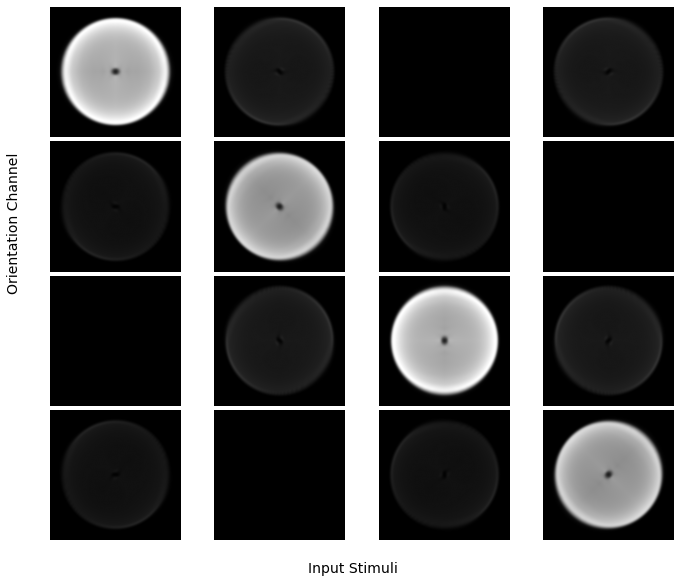

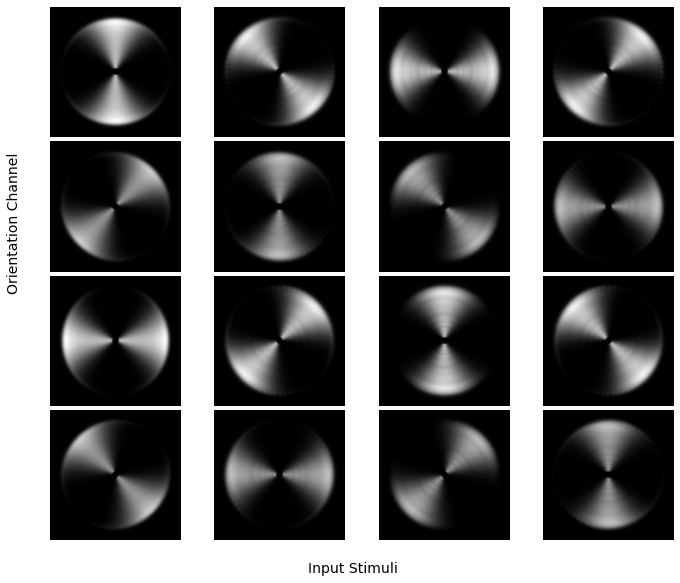

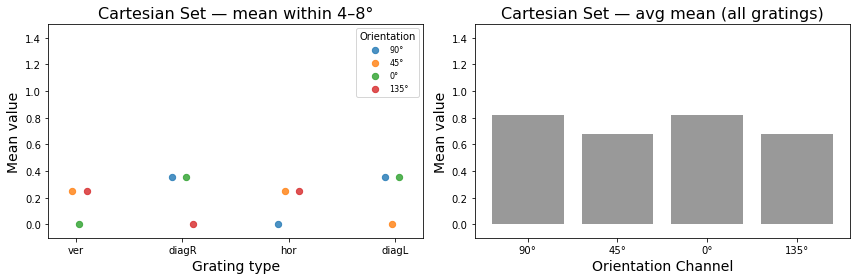

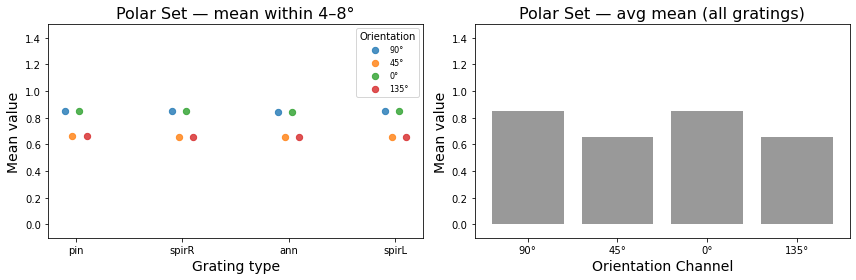

Cartesian Set


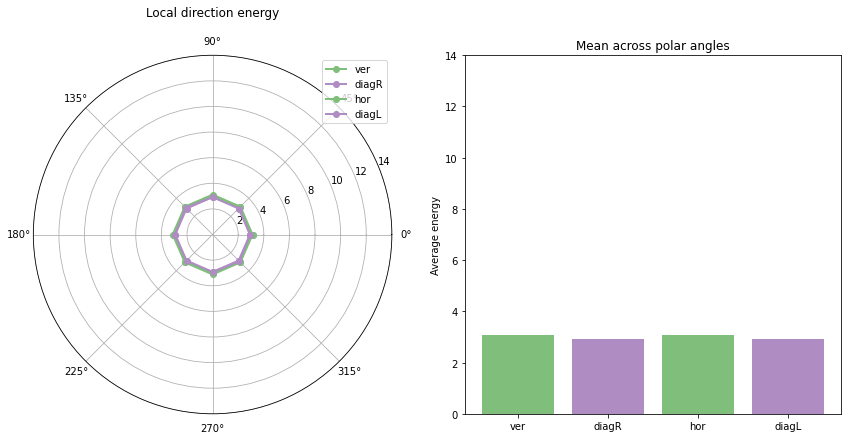

Polar Set


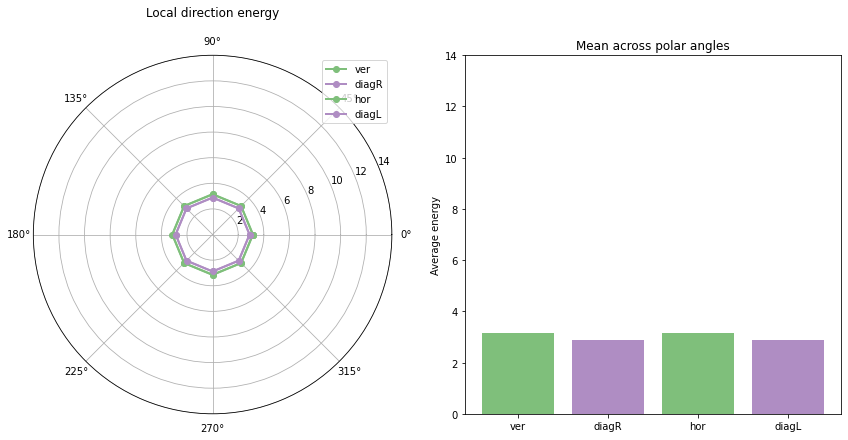

Cartesian Set


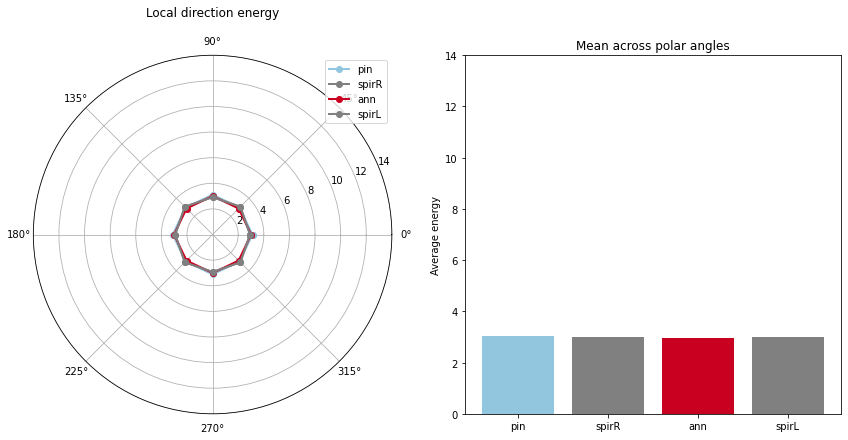

Polar Set


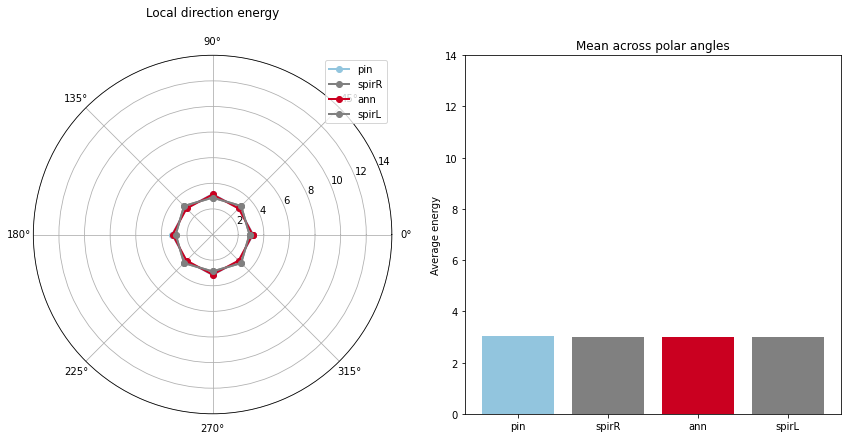

In [15]:
## visualize

utils_image.visualize_filter_magnitudes(untuned_norm_energy_aveSF, 0, scale=None, share_color_range=True, title=None,
                                        cbar=False, scale_factor=3, save_path=None)

utils_image.plot_energy_per_channel(untuned_norm_energy_aveSF, 0, pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[-.1, 1.5]) #1.4])

utils_image.plot_energy_per_stim(untuned_norm_energy_aveSF, 0, "Cartesian analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[0, 14])

utils_image.plot_energy_per_stim(untuned_norm_energy_aveSF, 0, "Polar analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[0, 14])

UNTUNED DIVISIVE NORMALIZATION -- with EXPONENTIAL SUPPRESSION
no scale given, so computing shared scale: global min/max


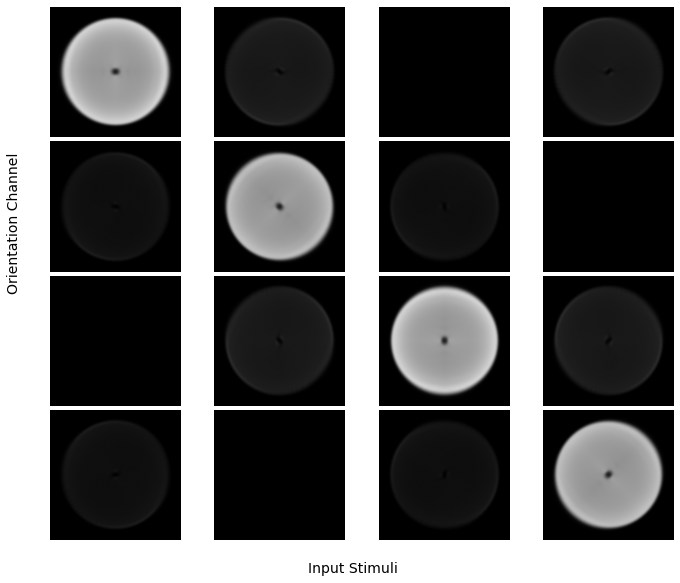

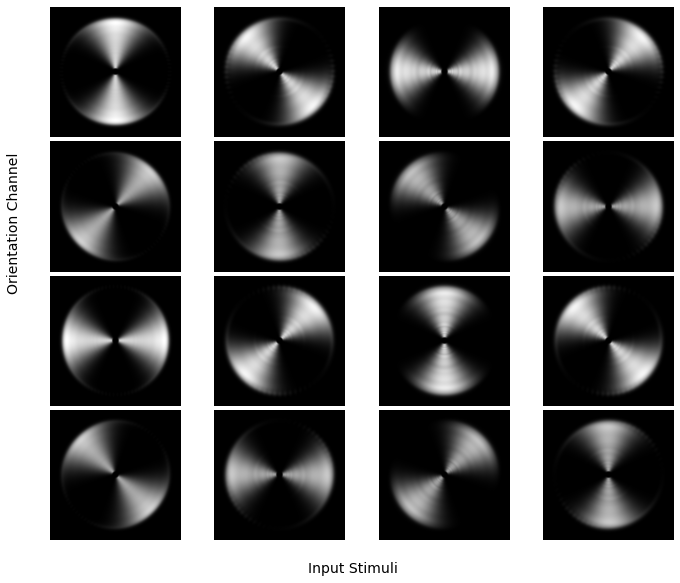

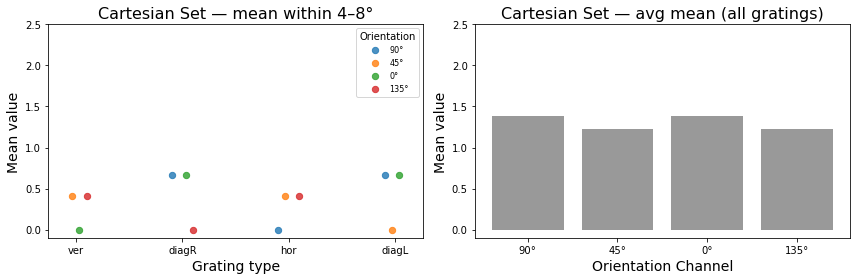

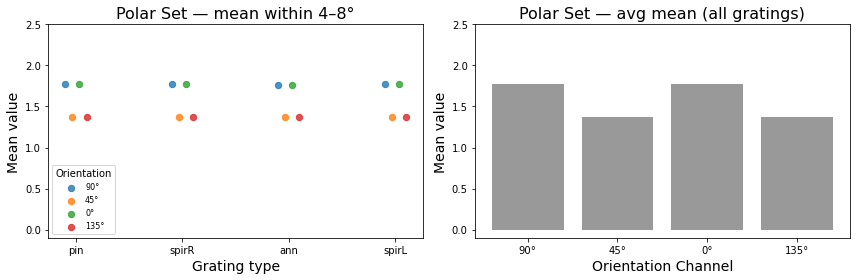

Cartesian Set


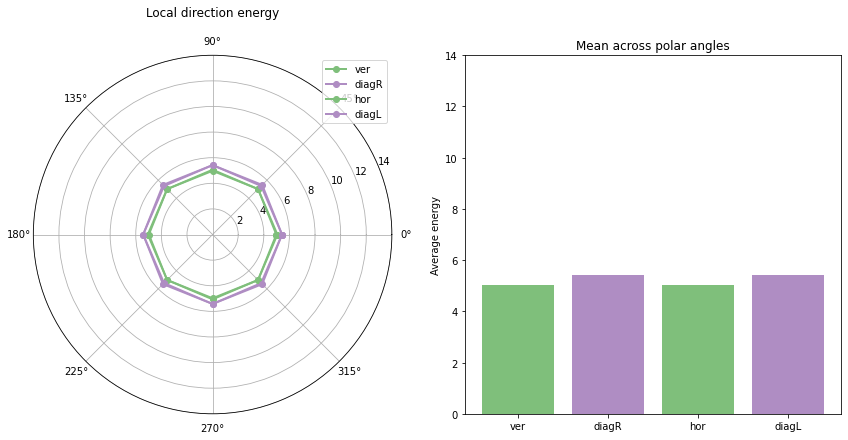

Polar Set


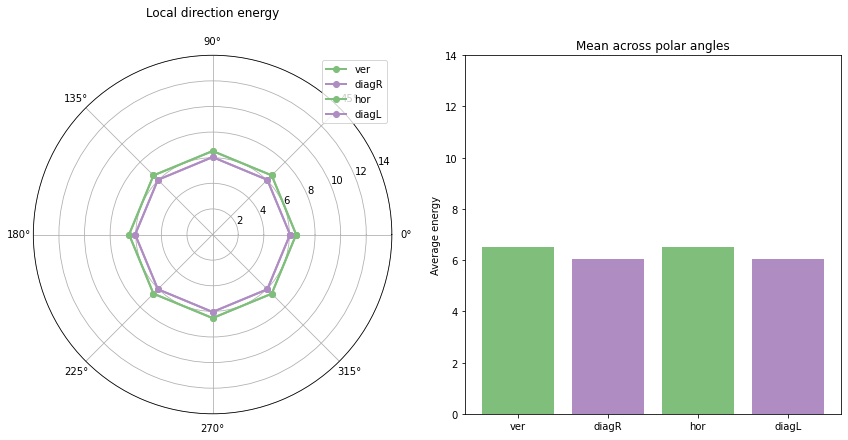

Cartesian Set


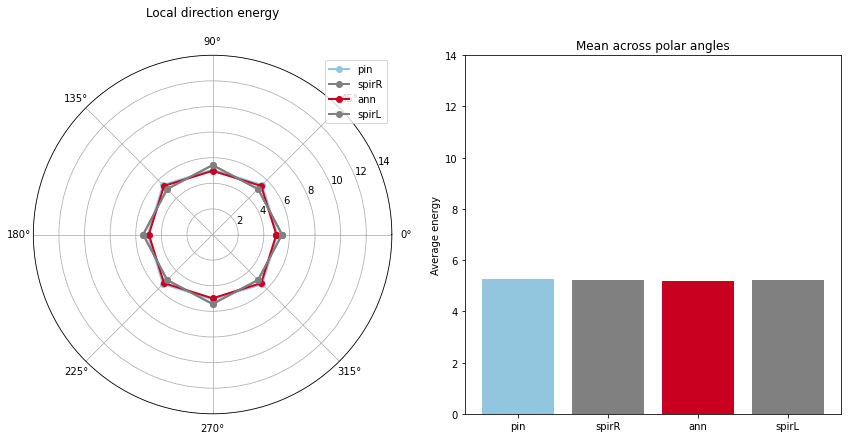

Polar Set


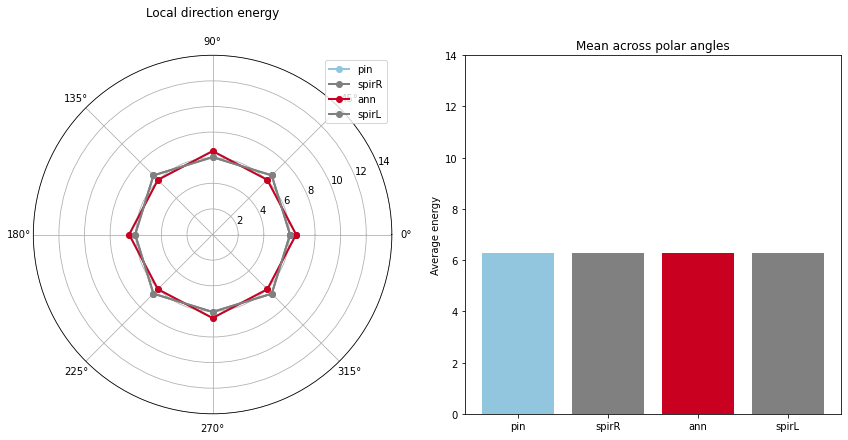

In [16]:
# exponential suppression
print("UNTUNED DIVISIVE NORMALIZATION -- with EXPONENTIAL SUPPRESSION")

expDen_norm_energy = utils_image.div_normalization(stim_energy_imb, pixpdeg, q_exp = 2, tuned=False)

expDen_norm_energy_aveSF = utils_image.condense_energy(expDen_norm_energy, dim=0, operation="mean")

utils_image.visualize_filter_magnitudes(expDen_norm_energy_aveSF, 0, scale=None, share_color_range=True, title=None,
                                        cbar=False, scale_factor=3, save_path=None)

utils_image.plot_energy_per_channel(expDen_norm_energy_aveSF, 0, pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[-.1, 2.5])

utils_image.plot_energy_per_stim(expDen_norm_energy_aveSF, 0, "Cartesian analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[0, 14])
utils_image.plot_energy_per_stim(expDen_norm_energy_aveSF, 0, "Polar analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[0, 14])

In [17]:
# vmin = min(image.min() for image in orituned_norm_energy.values())  # Smallest value across all images
# vmax = max(image.max() for image in orituned_norm_energy.values())
# print(vmin)
# print(vmax)

ORIENTATION-TUNED DIVISIVE NORMALIZATION
no scale given, so computing shared scale: global min/max


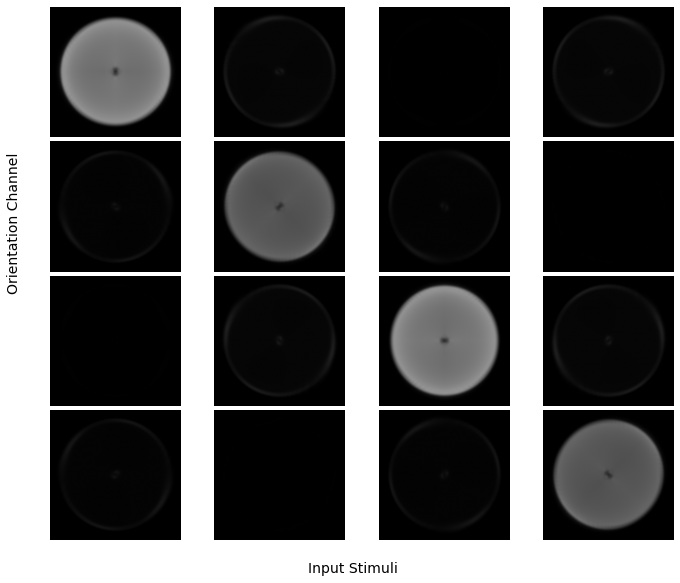

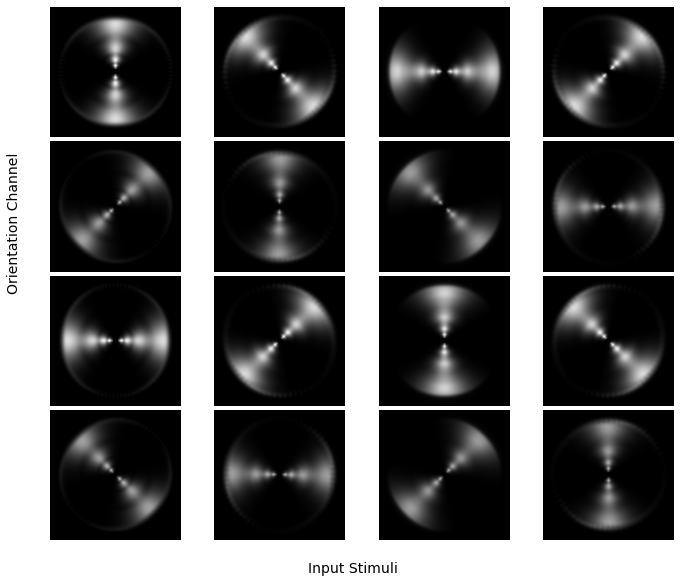

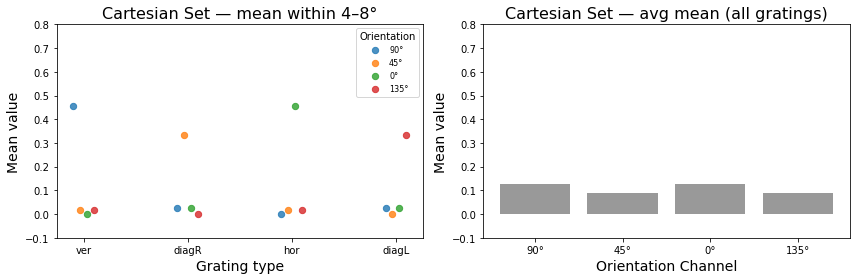

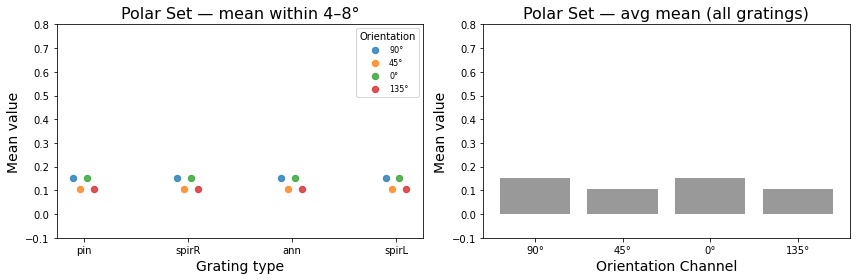

Cartesian Set


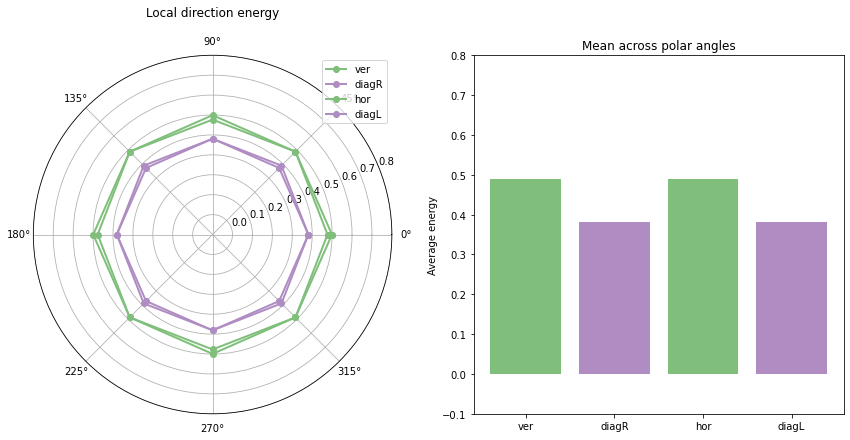

Polar Set


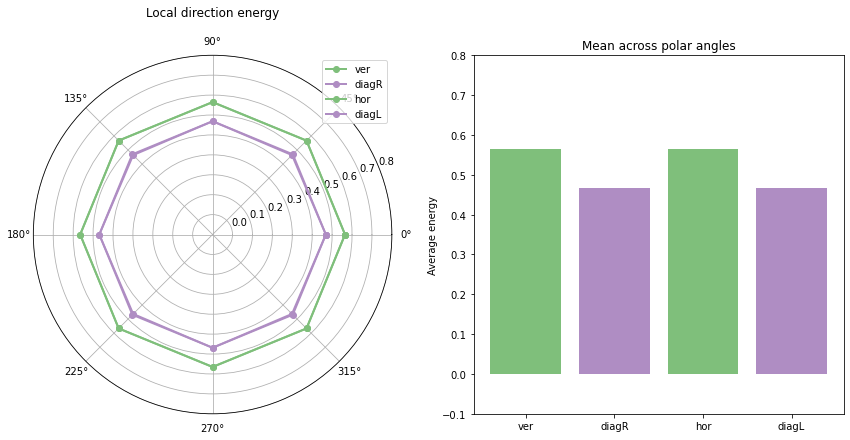

Cartesian Set


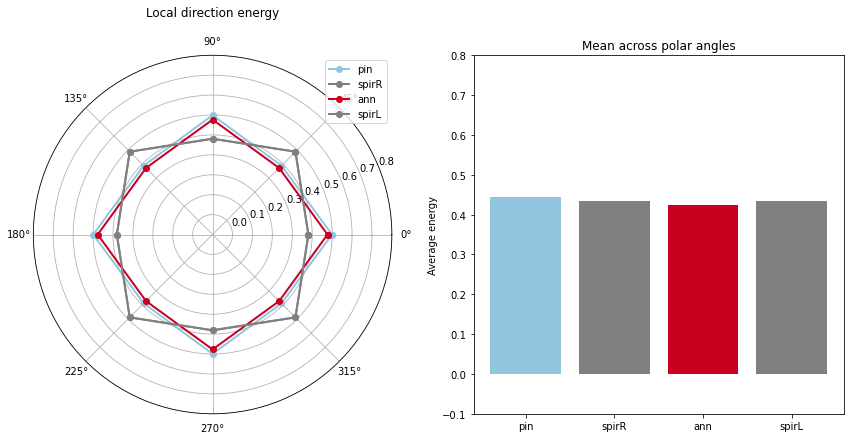

Polar Set


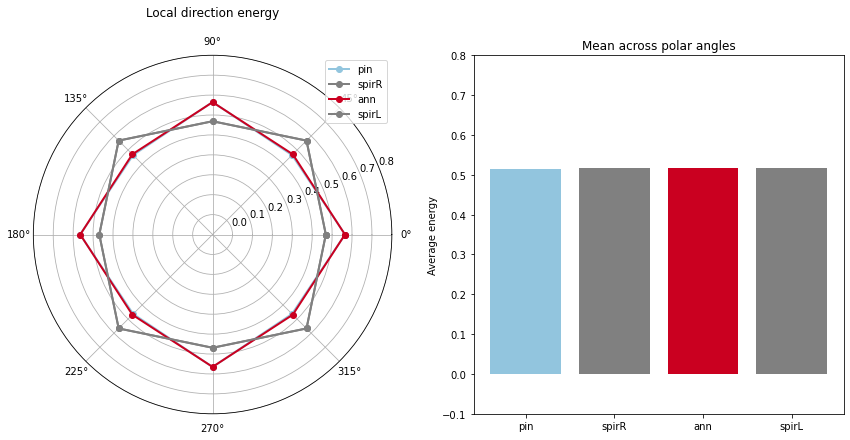

In [18]:
# ORIENTATION-TUNED NORMALIZATION
print("ORIENTATION-TUNED DIVISIVE NORMALIZATION")

orituned_norm_energy = utils_image.div_normalization(stim_energy_imb, pixpdeg, tuned=True)

orituned_norm_energy_aveSF = utils_image.condense_energy(orituned_norm_energy, dim=0, operation="mean")

utils_image.visualize_filter_magnitudes(orituned_norm_energy_aveSF, 0, scale=None, share_color_range=True, title=None,
                                        cbar=False, scale_factor=3, save_path=None)

utils_image.plot_energy_per_channel(orituned_norm_energy_aveSF, 0, pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[-.1, 0.8])

utils_image.plot_energy_per_stim(orituned_norm_energy_aveSF, 0, "Cartesian analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[-.1, 0.8])

utils_image.plot_energy_per_stim(orituned_norm_energy_aveSF, 0, "Polar analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[-.1, 0.8])

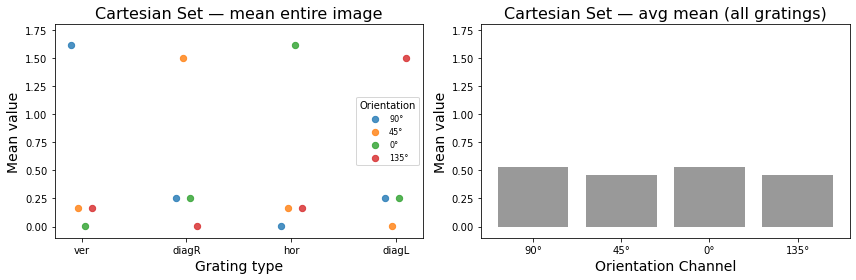

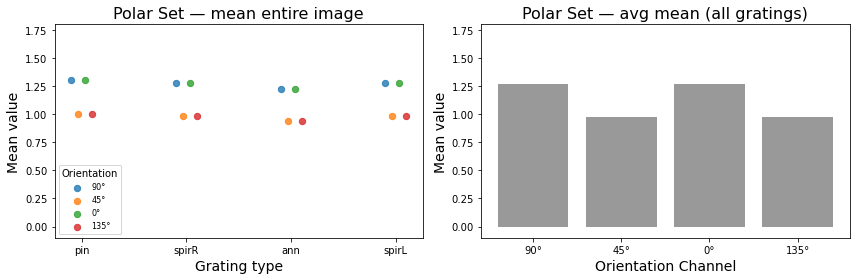

In [19]:
# normalization by anisotropy: combines SF and space

anisotropy_norm_energy = utils_image.normalization_byAnisotropy(stim_energy_imb, pixpdeg)

utils_image.plot_energy_per_channel(anisotropy_norm_energy, 0, pixpdeg, yrange=[-.1, 1.8])

no scale given, so computing shared scale: global min/max


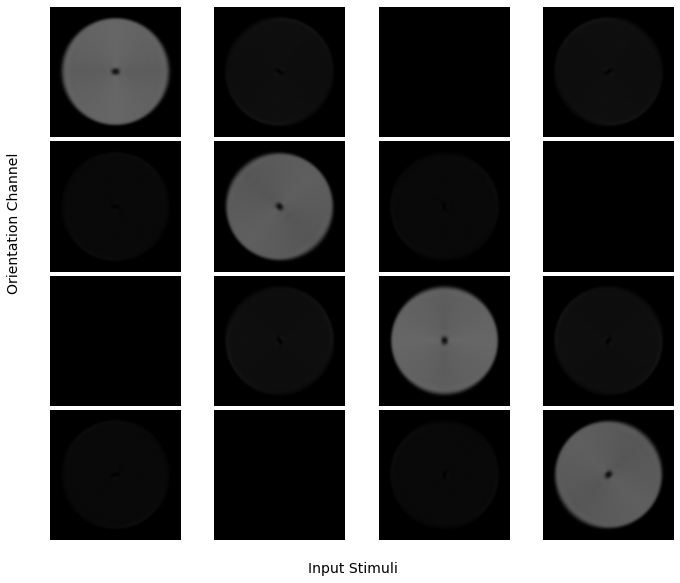

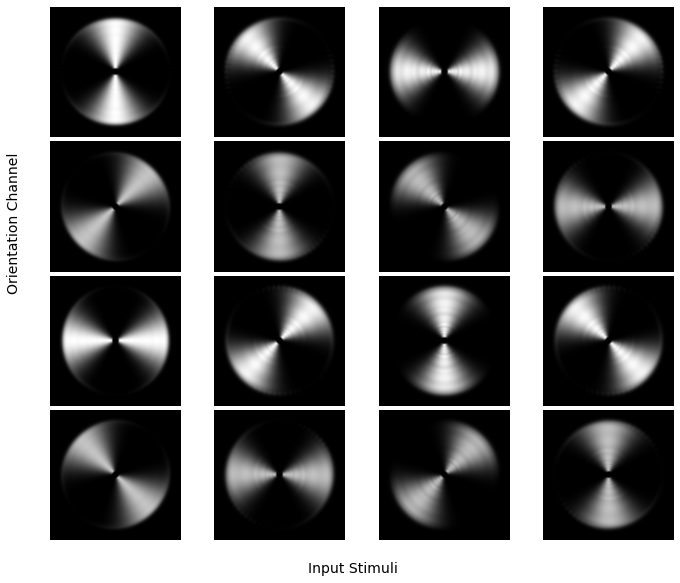

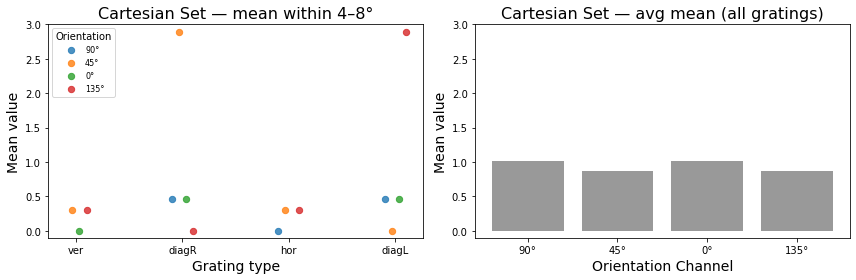

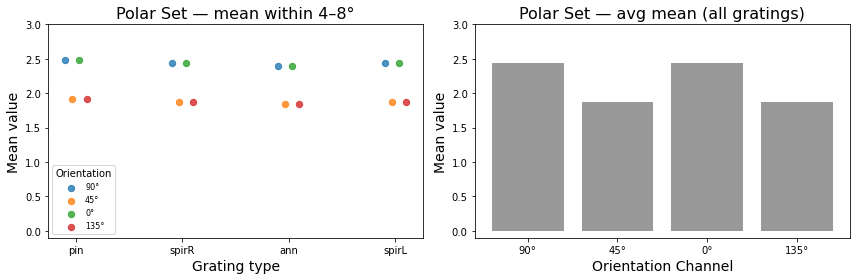

Cartesian Set


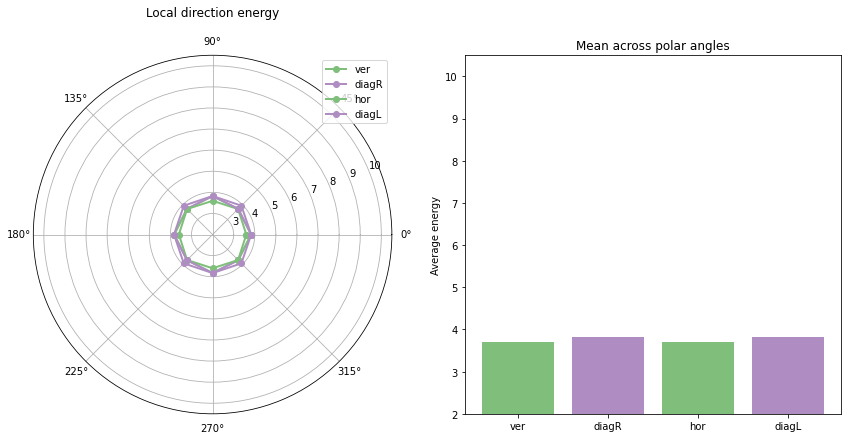

Polar Set


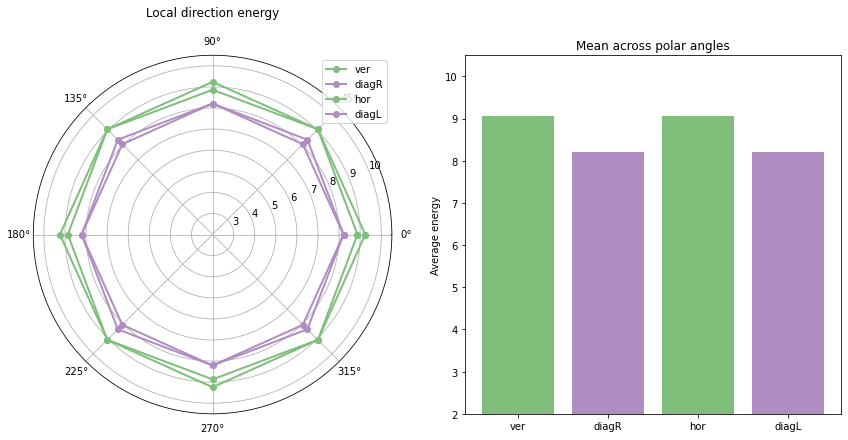

Cartesian Set


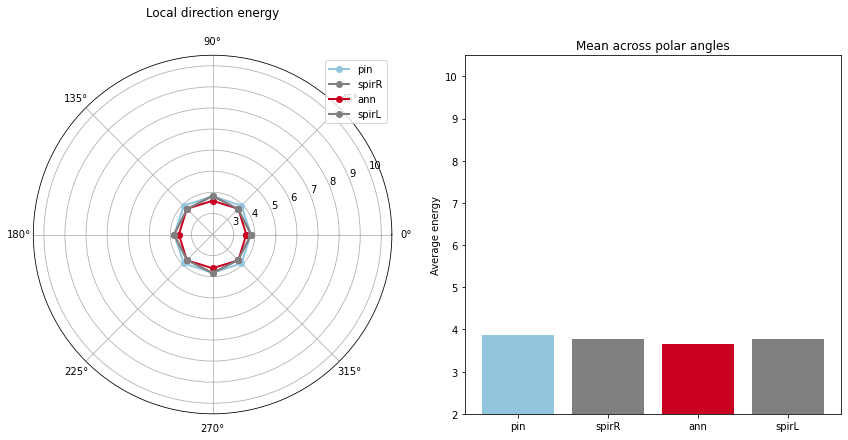

Polar Set


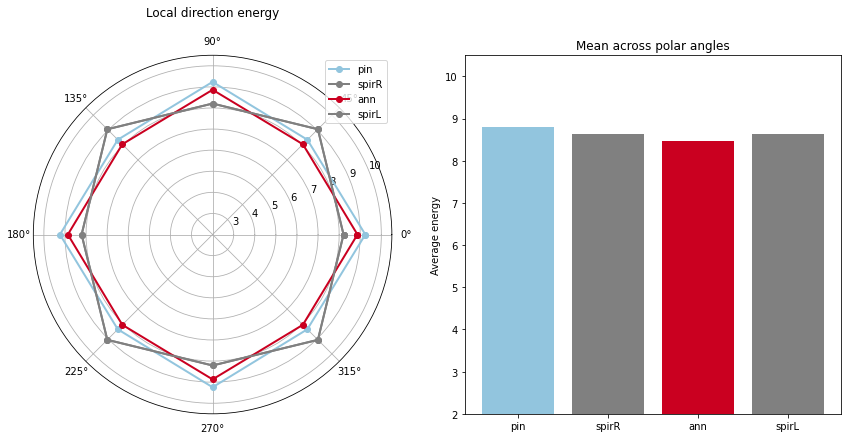

In [20]:
# anisotropy model

anisotropy_norm_energy2 = utils_image.normalization_byAnisotropy_NOA(stim_energy_imb, pixpdeg)

utils_image.visualize_filter_magnitudes(anisotropy_norm_energy2, 0, scale=None, share_color_range=True, title=None,
                                        cbar=False, scale_factor=3, save_path=None)

utils_image.plot_energy_per_channel(anisotropy_norm_energy2, 0, pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[-0.1, 3])

utils_image.plot_energy_per_stim(anisotropy_norm_energy2, 0, "Cartesian analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[2, 10.5])

utils_image.plot_energy_per_stim(anisotropy_norm_energy2, 0, "Polar analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[2, 10.5])


In [21]:
# center-surround stimulus homogeneity model

stimHomog_norm_energy = utils_image.normalization_byStimHomogeneity(stim_energy_imb, pixpdeg)

stimHomog_norm_energy_aveSF = utils_image.condense_energy(stimHomog_norm_energy, dim=0, operation="mean")



no scale given, so computing shared scale: global min/max


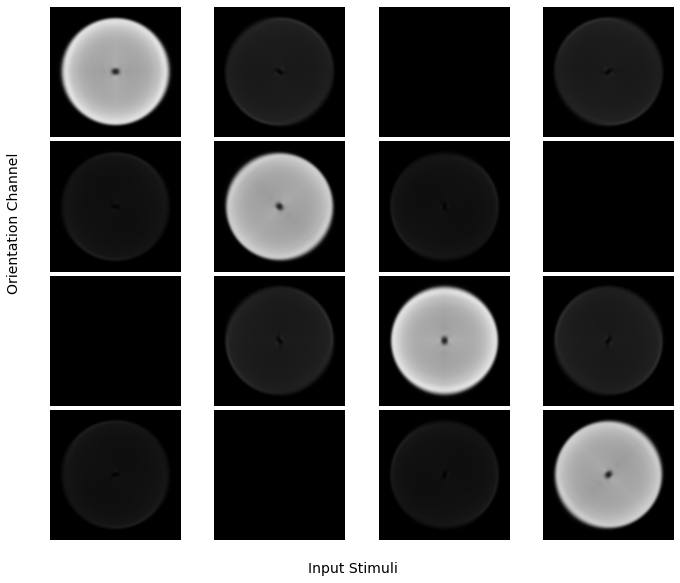

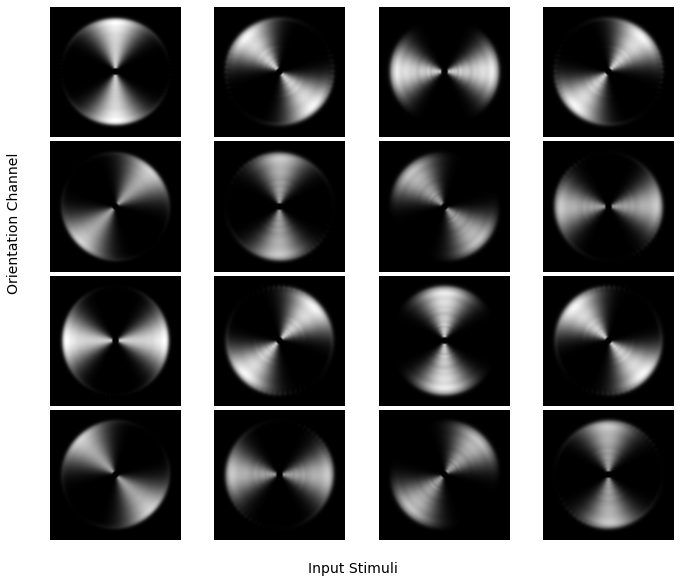

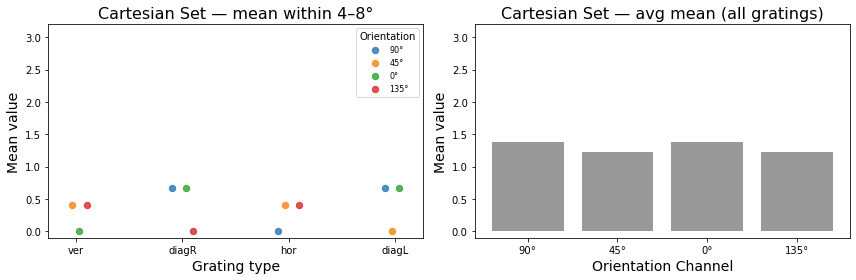

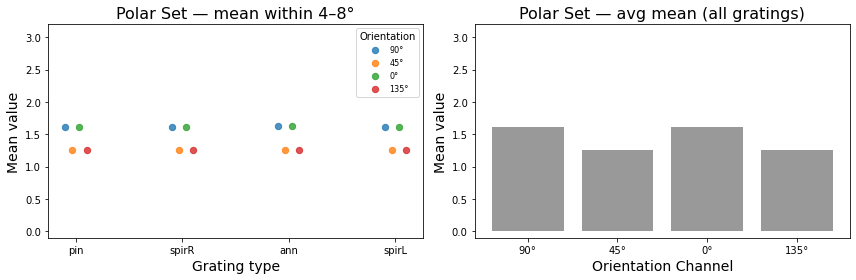

Cartesian Set


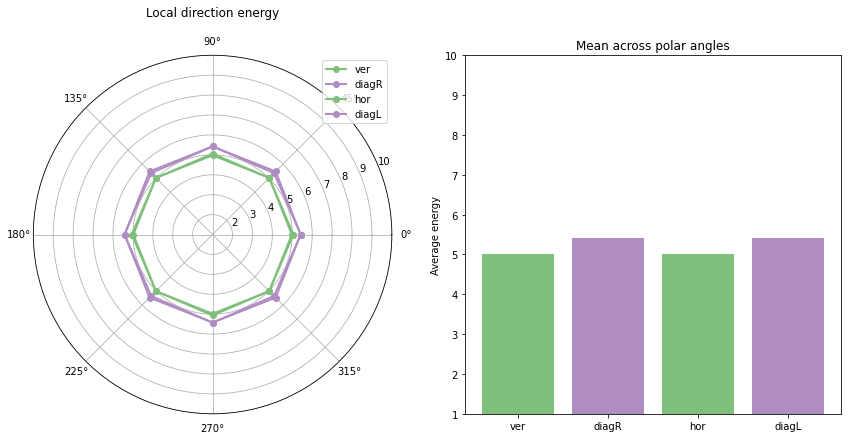

Polar Set


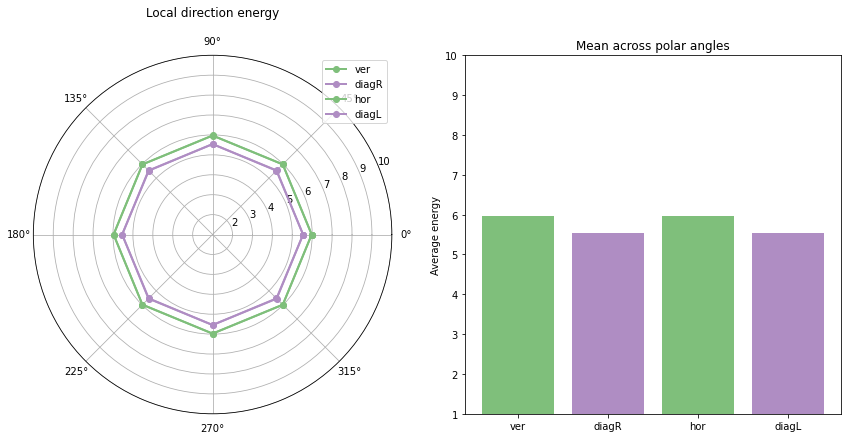

Cartesian Set


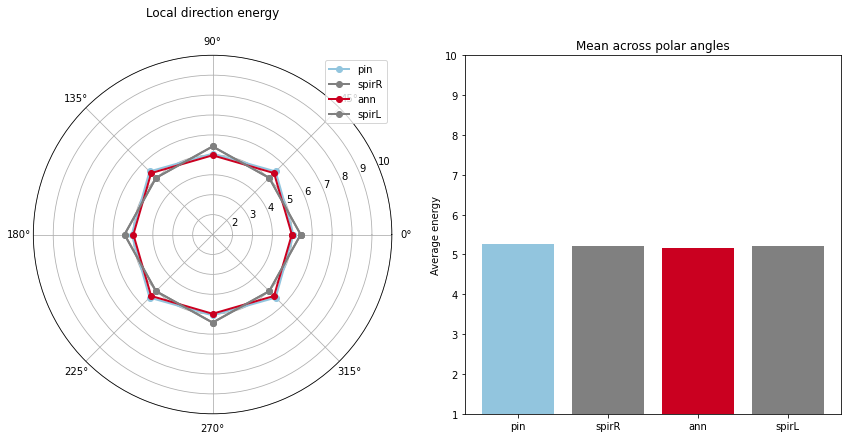

Polar Set


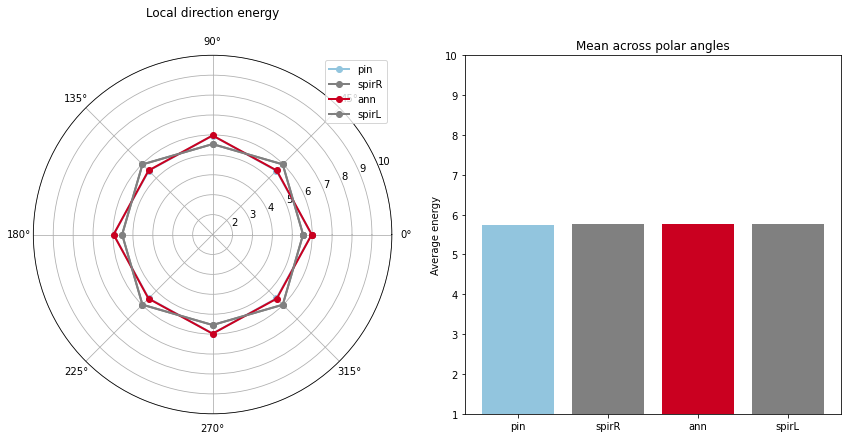

In [22]:
utils_image.visualize_filter_magnitudes(stimHomog_norm_energy_aveSF, 0, scale=None, share_color_range=True, title=None,
                                        cbar=False, scale_factor=3, save_path=None)

utils_image.plot_energy_per_channel(stimHomog_norm_energy_aveSF, 0, pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[-0.1, 3.2])

utils_image.plot_energy_per_stim(stimHomog_norm_energy_aveSF, 0, "Cartesian analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[1, 10])

utils_image.plot_energy_per_stim(stimHomog_norm_energy_aveSF, 0, "Polar analysis", pixpdeg, min_ecc_deg=4, max_ecc_deg=8, yrange=[1, 10])

In [23]:
# def plot_homogeneity_map(homogeneity, i, j, vmin=0, vmax=1):
#     H = homogeneity[i, j]   # shape (896, 896)

#     plt.figure(figsize=(6, 6))
#     plt.imshow(H, origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
#     plt.colorbar(label='Homogeneity')
#     plt.title(f'Homogeneity Map (set={i}, stim={j})')
#     plt.axis('off')
#     plt.tight_layout()
#     plt.show()

In [24]:
# plot_homogeneity_map(stimHomog_norm_energy, i=0, j=3)